In [19]:
from transformers import Sam3Processor, Sam3Model
import torch
from PIL import Image
import requests

device = "mps" if torch.cuda.is_available() else "cpu"
print(device)
model = Sam3Model.from_pretrained("facebook/sam3").to(device)
processor = Sam3Processor.from_pretrained("facebook/sam3")

# Load image
image_path = "./20211222_125057_petiole4_00000.tiff"
image = Image.open(image_path)

import numpy as np
    
# Convert to numpy array to handle different bit depths
img_array = np.array(image)

# Normalize based on bit depth
if img_array.dtype == np.uint16:
    # 16-bit image - normalize to 0-255 range
    img_array = (img_array / 65535.0 * 255).astype(np.uint8)
elif img_array.dtype == np.uint8:
    # Already 8-bit
    pass
else:
    # Float or other types - normalize to 0-255
    img_min = img_array.min()
    img_max = img_array.max()
    if img_max > img_min:
        img_array = ((img_array - img_min) / (img_max - img_min) * 255).astype(np.uint8)
    else:
        img_array = np.zeros_like(img_array, dtype=np.uint8)

# Convert to PIL Image and ensure RGB
image = Image.fromarray(img_array)

# Handle different image modes
if image.mode == 'L':  # Grayscale
    image = image.convert('RGB')
elif image.mode == 'I' or image.mode == 'F':  # 32-bit integer or float
    image = image.convert('RGB')
elif image.mode != 'RGB':
    image = image.convert('RGB')

# Segment using text prompt
inputs = processor(images=image, text="sand", return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)

# Post-process results
results = processor.post_process_instance_segmentation(
    outputs,
    threshold=0.5,
    mask_threshold=0.5,
    target_sizes=inputs.get("original_sizes").tolist()
)[0]

print(f"Found {len(results['masks'])} objects")
# Results contain:
# - masks: Binary masks resized to original image size
# - boxes: Bounding boxes in absolute pixel coordinates (xyxy format)
# - scores: Confidence scores


cpu


Loading weights: 100%|██████████| 1468/1468 [00:01<00:00, 1277.20it/s, Materializing param=vision_encoder.neck.fpn_layers.3.proj2.weight]                       


The OrderedVocab you are attempting to save contains holes for indices [1], your vocabulary could be corrupted !
The OrderedVocab you are attempting to save contains holes for indices [1], your vocabulary could be corrupted !
Found 0 objects


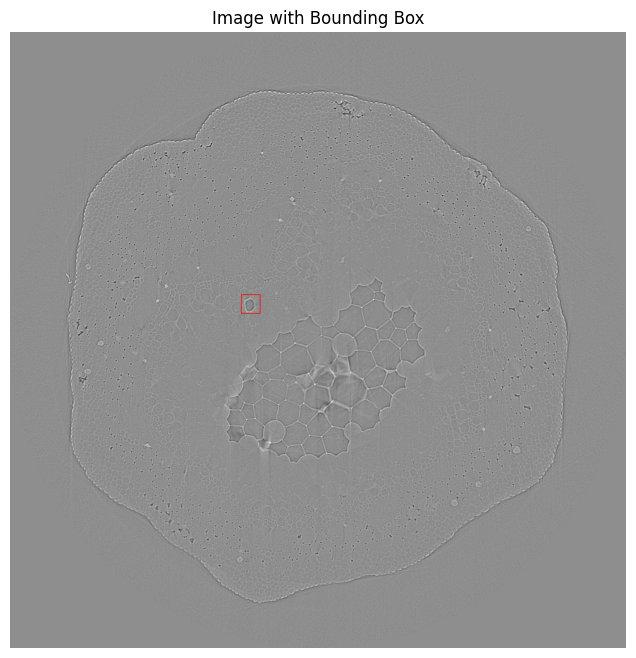

In [24]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Draw box on image for visualization
img_with_box = image.copy()
draw = ImageDraw.Draw(img_with_box)
box = [960, 1090, 1040, 1170]
draw.rectangle(box, outline="red", width=3)

# Display inline in notebook
plt.figure(figsize=(10, 8))
plt.imshow(img_with_box)
plt.axis('off')  # Hide axes
plt.title('Image with Bounding Box')
plt.show()

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


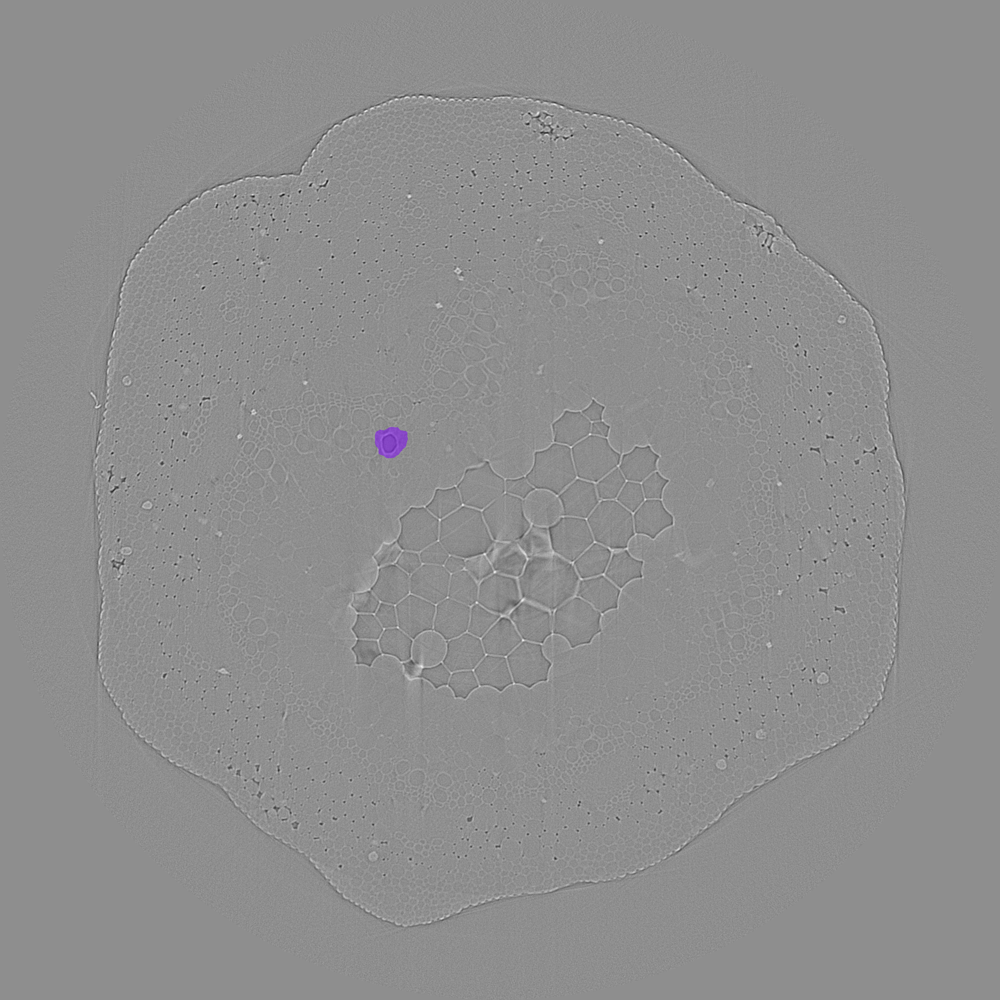

In [25]:
import numpy as np
import matplotlib
# Box in xyxy format: [x1, y1, x2, y2] in pixel coordinates
# Example: laptop region
box_xyxy = [960, 1090, 1040, 1170]
input_boxes = [[box_xyxy]]  # [batch, num_boxes, 4]
input_boxes_labels = [[1]]  # 1 = positive box

inputs = processor(
    images=image,
    input_boxes=input_boxes,
    input_boxes_labels=input_boxes_labels,
    return_tensors="pt"
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

# Post-process results
results = processor.post_process_instance_segmentation(
    outputs,
    threshold=0.5,
    mask_threshold=0.5,
    target_sizes=inputs.get("original_sizes").tolist()
)[0]

def overlay_masks(image, masks):
    image = image.convert("RGBA")
    masks = 255 * masks.cpu().numpy().astype(np.uint8)
    
    n_masks = masks.shape[0]
    cmap = matplotlib.colormaps.get_cmap("rainbow").resampled(n_masks)
    colors = [
        tuple(int(c * 255) for c in cmap(i)[:3])
        for i in range(n_masks)
    ]

    for mask, color in zip(masks, colors):
        print(mask)
        mask = Image.fromarray(mask)
        overlay = Image.new("RGBA", image.size, color + (0,))
        alpha = mask.point(lambda v: int(v * 0.5))
        overlay.putalpha(alpha)
        image = Image.alpha_composite(image, overlay)
    return image

overlay_masks(image, results["masks"])

